In [1]:
import numpy as np

In [2]:
from utils.contingency_space import ContingencySpace
from utils.confusion_matrix import ConfusionMatrix

In [ ]:
cs = ContingencySpace([ConfusionMatrix({'t': [70, 30], 
                                        'f': [200, 200]}),
                       ConfusionMatrix({'t': [100, 0], 
                                        'f': [200, 200]})])

In [4]:
from metrics import hss, tss, tau

Lets take a a 

[np.float64(0.0), np.float64(3.0), np.float64(6.0), np.float64(10.0), np.float64(13.0), np.float64(17.0), np.float64(20.0), np.float64(24.0), np.float64(27.0), np.float64(31.0), np.float64(34.0), np.float64(37.0), np.float64(41.0), np.float64(44.0), np.float64(48.0), np.float64(51.0), np.float64(55.00000000000001), np.float64(57.99999999999999), np.float64(62.0), np.float64(65.0), np.float64(68.0), np.float64(72.0), np.float64(75.0), np.float64(79.0), np.float64(82.0), np.float64(86.0), np.float64(89.0), np.float64(93.0), np.float64(96.0), np.float64(100.0), np.float64(0.0), np.float64(3.0), np.float64(6.0), np.float64(10.0), np.float64(13.0), np.float64(17.0), np.float64(20.0), np.float64(24.0), np.float64(27.0), np.float64(31.0), np.float64(34.0), np.float64(37.0), np.float64(41.0), np.float64(44.0), np.float64(48.0), np.float64(51.0), np.float64(55.00000000000001), np.float64(57.99999999999999), np.float64(62.0), np.float64(65.0), np.float64(68.0), np.float64(72.0), np.float64(75.0)

C:\Users\Colin\Documents\Apps\Python\contingency_space\utils\contingency_space.py:220: UserWarning: The following kwargs were not used by contour: 'edgecolor', 'linewidth'
  cs2 = ax.contour(base_x_mesh, base_y_mesh, base_z, 30, vmin=-1, vmax=1, cmap='twilight', edgecolor='black', linewidth=9, linewidths=1.7, linestyles='solid', )


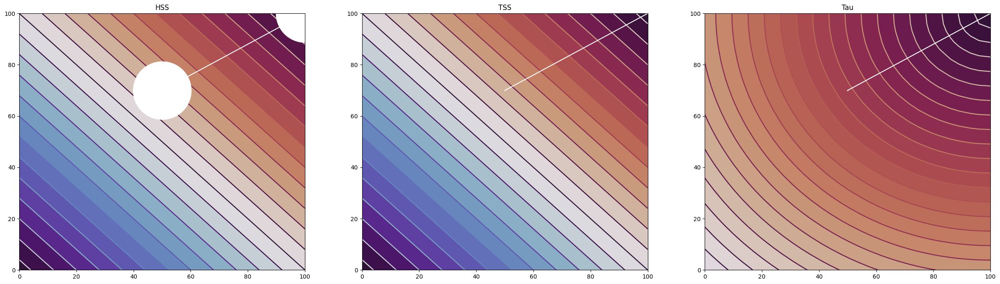

In [5]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3)
fig.set_figheight(8)
fig.set_figwidth(30)
cs.visualize(metric=hss, projection='2d', ax=axes[0], title='HSS', point_size=100)
cs.visualize(metric=tss, projection='2d', ax=axes[1], title='TSS')
cs.visualize(metric=tau, projection='2d', ax=axes[2], title='Tau')

plt.show()

In [6]:
imbalance_ratios = [(1, 1), (1, 10), (1, 20), (1, 30), (1, 40), (1, 50)]

In [7]:
contingency_spaces = []

for t, f in imbalance_ratios:
    contingency_spaces.append(ContingencySpace([ConfusionMatrix({'t': [t*100, 0], 
                                                                 'f': [0, f*100]})]))

In [8]:
from metrics import accuracy

Now, lets take a look at how these evaluation metrics are affected by class imbalances in the dataset. 

We will start with the Heidke Skill Score (or HSS):

C:\Users\Colin\AppData\Local\Temp\ipykernel_37500\3671679141.py:4: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(right=0.85)


[np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.000000000000001), np.float64(8.0), np.float64(9.0), np.float64(10.0), np.float64(11.0), np.float64(12.0), np.float64(13.0), np.float64(14.000000000000002), np.float64(15.0), np.float64(16.0), np.float64(17.0), np.float64(18.0), np.float64(19.0), np.float64(20.0), np.float64(21.0), np.float64(22.0), np.float64(23.0), np.float64(24.0), np.float64(25.0), np.float64(26.0), np.float64(27.0), np.float64(28.000000000000004), np.float64(28.999999999999996), np.float64(30.0), np.float64(31.0), np.float64(32.0), np.float64(33.0), np.float64(34.0), np.float64(35.0), np.float64(36.0), np.float64(37.0), np.float64(38.0), np.float64(39.0), np.float64(40.0), np.float64(41.0), np.float64(42.0), np.float64(43.0), np.float64(44.0), np.float64(45.0), np.float64(46.0), np.float64(47.0), np.float64(48.0), np.float64(49.0), np.float64(50.0), np.float64(51.0), np.float64(52.0),

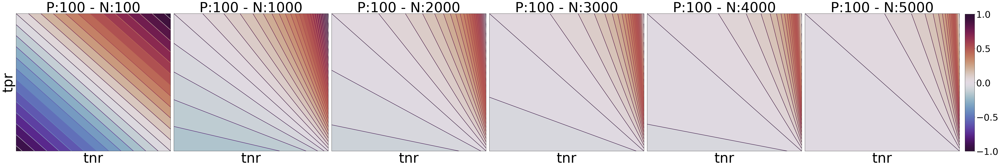

In [9]:
import matplotlib as mpl

fig, axes = plt.subplots(1, 6, figsize=(58, 10), layout='compressed')
fig.subplots_adjust(right=0.85)

axes[0].set_ylabel('tpr', fontsize=60)

cs: ContingencySpace

for index, ((x, y), cs) in enumerate(zip(imbalance_ratios, contingency_spaces)):
    axes[index].set_title(f'P:{x*100} - N:{y*100}', fontsize=60)
    axes[index].set_xlabel('tnr', fontsize=60)
    
    plt.locator_params(axis='y', nbins=5)
    plt.locator_params(axis='x', nbins=5)
    # axes[index].set_xticks([0, 25, 50, 75, 100])
    # axes[index].set_xticklabels([0.0, 0.25, 0.5, 0.75, 1.0], fontsize=20)
    # axes[index].set_yticks([0, y*100*0.25, y*100*0.5, y*100*0.75, y*100])
    # axes[index].set_yticklabels([0.0, 0.25, 0.5, 0.75, 1.0], fontsize=20)
    
    axes[index].tick_params(
        left = False,
        right = False,
        top = False,
        bottom = False,
        labelleft = False,
        labelbottom = False
    )
    
    cs.visualize(metric=hss, ax=axes[index], step_size=100)

norm = mpl.colors.Normalize(vmin=-1, vmax=1)
sm = plt.cm.ScalarMappable(cmap='twilight_shifted', norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([1.005, 0.09, 0.01, 0.83])
cbar = fig.colorbar(sm, ticks=[-1.0, -0.5, 0.0, 0.5, 1.0], cax=cbar_ax)
cbar.ax.tick_params(labelsize=40)
plt.savefig("hss_imbalance.pdf", format='pdf', bbox_inches='tight')
plt.show()

C:\Users\Colin\AppData\Local\Temp\ipykernel_37500\2720954582.py:4: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(right=0.85)


[np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.000000000000001), np.float64(8.0), np.float64(9.0), np.float64(10.0), np.float64(11.0), np.float64(12.0), np.float64(13.0), np.float64(14.000000000000002), np.float64(15.0), np.float64(16.0), np.float64(17.0), np.float64(18.0), np.float64(19.0), np.float64(20.0), np.float64(21.0), np.float64(22.0), np.float64(23.0), np.float64(24.0), np.float64(25.0), np.float64(26.0), np.float64(27.0), np.float64(28.000000000000004), np.float64(28.999999999999996), np.float64(30.0), np.float64(31.0), np.float64(32.0), np.float64(33.0), np.float64(34.0), np.float64(35.0), np.float64(36.0), np.float64(37.0), np.float64(38.0), np.float64(39.0), np.float64(40.0), np.float64(41.0), np.float64(42.0), np.float64(43.0), np.float64(44.0), np.float64(45.0), np.float64(46.0), np.float64(47.0), np.float64(48.0), np.float64(49.0), np.float64(50.0), np.float64(51.0), np.float64(52.0),

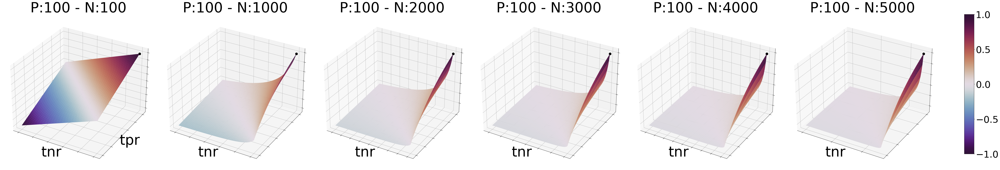

In [10]:
import matplotlib as mpl

fig, axes = plt.subplots(1, 6, figsize=(58, 10), layout='compressed', subplot_kw=dict(projection='3d'))
fig.subplots_adjust(right=0.85)

axes[0].set_ylabel('tpr', fontsize=60)

cs: ContingencySpace

for index, ((x, y), cs) in enumerate(zip(imbalance_ratios, contingency_spaces)):
    axes[index].set_title(f'P:{x*100} - N:{y*100}', fontsize=60)
    axes[index].set_xlabel('tnr', fontsize=60)
    
    plt.locator_params(axis='y', nbins=5)
    plt.locator_params(axis='x', nbins=5)
    # axes[index].set_xticks([0, 25, 50, 75, 100])
    # axes[index].set_xticklabels([0.0, 0.25, 0.5, 0.75, 1.0], fontsize=20)
    # axes[index].set_yticks([0, y*100*0.25, y*100*0.5, y*100*0.75, y*100])
    # axes[index].set_yticklabels([0.0, 0.25, 0.5, 0.75, 1.0], fontsize=20)
    
    axes[index].tick_params(
        left = False,
        right = False,
        top = False,
        bottom = False,
        labelleft = False,
        labelbottom = False
    )
    
    cs.visualize(metric=hss, ax=axes[index], step_size=100, projection='3d')

norm = mpl.colors.Normalize(vmin=-1, vmax=1)
sm = plt.cm.ScalarMappable(cmap='twilight_shifted', norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([1.005, 0.09, 0.01, 0.83])
cbar = fig.colorbar(sm, ticks=[-1.0, -0.5, 0.0, 0.5, 1.0], cax=cbar_ax)
cbar.ax.tick_params(labelsize=40)
plt.savefig("hss_imbalance.pdf", format='pdf', bbox_inches='tight')
plt.show()

As you can see, HSS is affected by the imbalances. For the purposes of experiments that use datasets such as the SWAN-F dataset, which are highly imbalanced (such as 80:1 in some cases), this makes the score highly sensitive to changes in the class with the smaller size.

Now, we can look at True Skill Score (TSS):

[np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.000000000000001), np.float64(8.0), np.float64(9.0), np.float64(10.0), np.float64(11.0), np.float64(12.0), np.float64(13.0), np.float64(14.000000000000002), np.float64(15.0), np.float64(16.0), np.float64(17.0), np.float64(18.0), np.float64(19.0), np.float64(20.0), np.float64(21.0), np.float64(22.0), np.float64(23.0), np.float64(24.0), np.float64(25.0), np.float64(26.0), np.float64(27.0), np.float64(28.000000000000004), np.float64(28.999999999999996), np.float64(30.0), np.float64(31.0), np.float64(32.0), np.float64(33.0), np.float64(34.0), np.float64(35.0), np.float64(36.0), np.float64(37.0), np.float64(38.0), np.float64(39.0), np.float64(40.0), np.float64(41.0), np.float64(42.0), np.float64(43.0), np.float64(44.0), np.float64(45.0), np.float64(46.0), np.float64(47.0), np.float64(48.0), np.float64(49.0), np.float64(50.0), np.float64(51.0), np.float64(52.0),

C:\Users\Colin\Documents\Apps\Python\contingency_space\utils\contingency_space.py:220: UserWarning: The following kwargs were not used by contour: 'edgecolor', 'linewidth'
  cs2 = ax.contour(base_x_mesh, base_y_mesh, base_z, 30, vmin=-1, vmax=1, cmap='twilight', edgecolor='black', linewidth=9, linewidths=1.7, linestyles='solid', )


[np.float64(0.0), np.float64(10.0), np.float64(20.0), np.float64(30.0), np.float64(40.0), np.float64(50.0), np.float64(60.0), np.float64(70.0), np.float64(80.0), np.float64(90.0), np.float64(101.0), np.float64(111.0), np.float64(121.0), np.float64(131.0), np.float64(141.0), np.float64(151.0), np.float64(161.0), np.float64(171.0), np.float64(181.0), np.float64(191.0), np.float64(202.0), np.float64(212.0), np.float64(222.0), np.float64(232.0), np.float64(242.0), np.float64(252.0), np.float64(262.0), np.float64(272.0), np.float64(282.0), np.float64(292.0), np.float64(303.0), np.float64(313.0), np.float64(323.0), np.float64(333.0), np.float64(343.0), np.float64(353.0), np.float64(363.0), np.float64(373.0), np.float64(383.0), np.float64(393.0), np.float64(404.0), np.float64(414.0), np.float64(424.0), np.float64(434.0), np.float64(444.0), np.float64(454.0), np.float64(464.0), np.float64(474.0), np.float64(484.0), np.float64(494.0), np.float64(505.0), np.float64(515.0), np.float64(525.0), np.

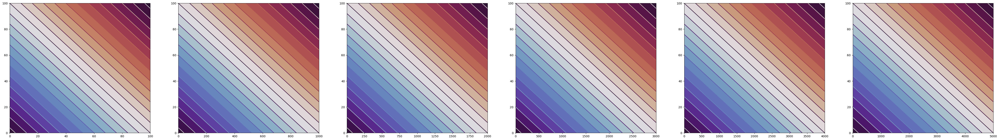

In [11]:
fig, axes = plt.subplots(1, 6)
fig.set_figwidth(60)
fig.set_figheight(8)

for index, cs in enumerate(contingency_spaces):
    cs.visualize(metric=tss, ax=axes[index], step_size=100)
    
plt.show()

And our metric, Tau:

[np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.000000000000001), np.float64(8.0), np.float64(9.0), np.float64(10.0), np.float64(11.0), np.float64(12.0), np.float64(13.0), np.float64(14.000000000000002), np.float64(15.0), np.float64(16.0), np.float64(17.0), np.float64(18.0), np.float64(19.0), np.float64(20.0), np.float64(21.0), np.float64(22.0), np.float64(23.0), np.float64(24.0), np.float64(25.0), np.float64(26.0), np.float64(27.0), np.float64(28.000000000000004), np.float64(28.999999999999996), np.float64(30.0), np.float64(31.0), np.float64(32.0), np.float64(33.0), np.float64(34.0), np.float64(35.0), np.float64(36.0), np.float64(37.0), np.float64(38.0), np.float64(39.0), np.float64(40.0), np.float64(41.0), np.float64(42.0), np.float64(43.0), np.float64(44.0), np.float64(45.0), np.float64(46.0), np.float64(47.0), np.float64(48.0), np.float64(49.0), np.float64(50.0), np.float64(51.0), np.float64(52.0),

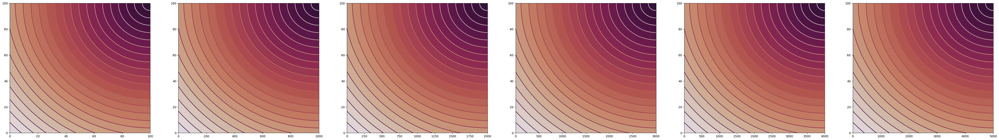

In [12]:
fig, axes = plt.subplots(1, 6)
fig.set_figwidth(60)
fig.set_figheight(8)

for index, cs in enumerate(contingency_spaces):
    cs.visualize(metric=tau, ax=axes[index], step_size=100)
    
plt.show()

As you can see, these are not affected by imbalances in the dataset. Their contour plot on the Contingency Space remains unchanged. 

C:\Users\Colin\Documents\Apps\Python\contingency_space\utils\contingency_space.py:219: UserWarning: The following kwargs were not used by contour: 'edgecolor', 'linewidth'
  cs2 = ax.contour(base_x_mesh, base_y_mesh, base_z, 30, vmin=-1, vmax=1, cmap='twilight', edgecolor='black', linewidth=9, linewidths=1.7, linestyles='solid', )


Matrix 1:
HSS: 0.06278936461043255
TSS: 0.5
Matrix 2:
HSS: 0.6591822897778339
TSS: 0.5


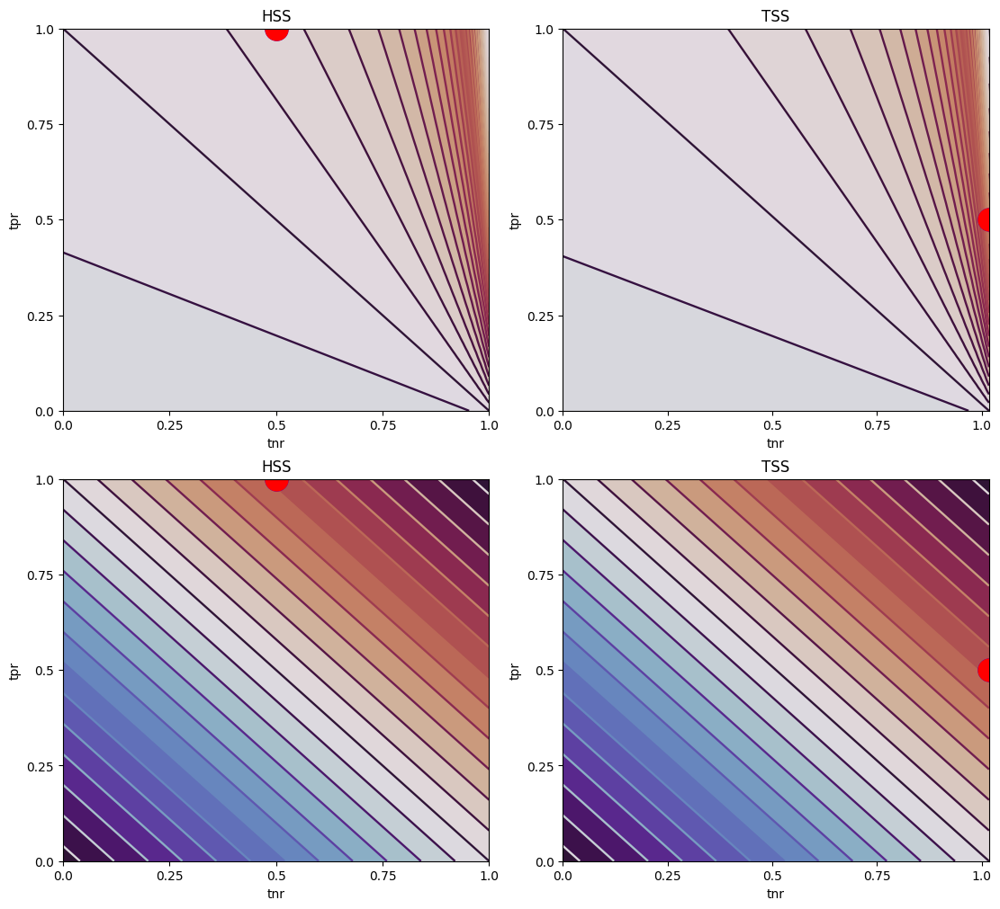

In [4]:
import matplotlib.pyplot as plt
from utils.contingency_space import ContingencySpace
from utils.confusion_matrix import ConfusionMatrix
from metrics import hss, tss

matrices1 = [ConfusionMatrix({'t': [1424, 0], 
                          'f': [20543, 20543]})]

matrices2 = [ConfusionMatrix({'t': [712, 712],
                             'f': [0, 41806]})]

space1 = ContingencySpace(matrices1)
space2 = ContingencySpace(matrices2)

fig, axes = plt.subplots(2, 2, layout='compressed')
fig.set_figwidth(11)
fig.set_figheight(10)

for row in axes:
    for ax in row:
        ax.set_xlabel('tnr', fontsize=10)
        ax.set_ylabel('tpr', fontsize=10)


        plt.locator_params(axis='y', nbins=5)
        plt.locator_params(axis='x', nbins=5)
        ax.set_yticks([0, 356, 712, 1068, 1424])
        ax.set_yticklabels([0.0, 0.25, 0.5, 0.75, 1.0], fontsize=10)
        ax.set_xticks([0, 10271.5, 20543, 30814.5, 41086])
        ax.set_xticklabels([0.0, 0.25, 0.5, 0.75, 1.0], fontsize=10)

space1.visualize(metric=hss, ax=axes[0][0], step_size=100, projection='2d', title='HSS', point_size=9)
print('Matrix 1:')
print(f'HSS: {hss(matrices1[0])}')
print(f'TSS: {tss(matrices1[0])}')
space2.visualize(metric=hss, ax=axes[0][1], step_size=100, projection='2d', title='TSS', point_size=9)
print('Matrix 2:')
print(f'HSS: {hss(matrices2[0])}')
print(f'TSS: {tss(matrices2[0])}')

space1.visualize(metric=tss, ax=axes[1][0], step_size=100, projection='2d', title='HSS', point_size=9)
space2.visualize(metric=tss, ax=axes[1][1], step_size=100, projection='2d', title='TSS', point_size=9)



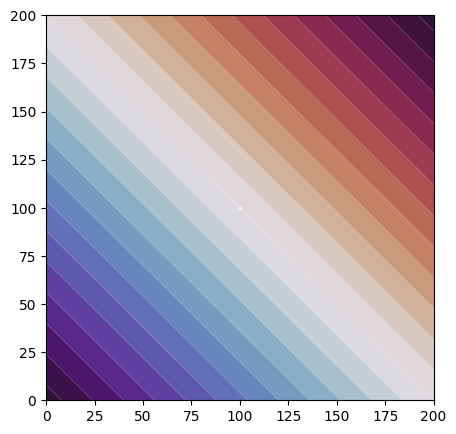

In [2]:
from utils import ContingencySpace, ConfusionMatrix

cs = ContingencySpace([ConfusionMatrix({'t': [100, 100],
                                        'f': [100, 100]})])

cs.visualize(metric=hss, projection='2d', step_size=100)

Above, we observe two models, with distinct performances. In the first matrix, we observe a 0.5 true negative rate and 1.0 true positive rate. In the context of a 

0: 0.9066666666666666
1: 0.928409090909091
2: 0.9511627906976744
3: 0.975
4: 0.9774463007159905
5: 0.9799043062200957
6: 0.9823741007194244
7: 0.9848557692307692
8: 0.9873493975903614
9: 0.9898550724637681
10: 0.9923728813559322
11: 0.9949029126213592
12: 0.9974452554744525
13: 0.9979552093476144
14: 0.9984656600097418
15: 0.9989766081871345
16: 0.9994880546075086
17: 1.0


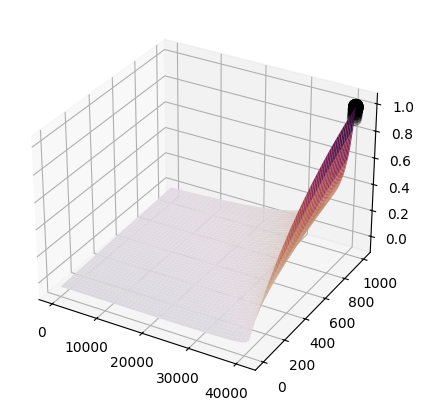

In [1]:
from utils import ContingencySpace, ConfusionMatrix
from metrics import hss

cs = ContingencySpace([ConfusionMatrix({'t': [1000, 0],
                                        'f': [200, 40800]}),
                          ConfusionMatrix({'t': [1000, 0],
                                        'f': [150, 40850]}),
                            ConfusionMatrix({'t': [1000, 0],
                                        'f': [100, 40900]}),
                            ConfusionMatrix({'t': [1000, 0],
                                        'f': [50, 40950]}),
                            ConfusionMatrix({'t': [1000, 0],
                                             'f': [45, 40955]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [40, 40960]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [35, 40965]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [30, 40970]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [25, 40975]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [20, 40980]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [15, 40985]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [10, 40990]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [5, 40995]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [4, 40996]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [3, 40997]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [2, 40998]}),
                            ConfusionMatrix({'t': [1000, 0],
                                                'f': [1, 40999]}),
                            ConfusionMatrix({'t': [1000, 0],
                                        'f': [0, 41000]})])

for i in range(18):
    print(f'{i}: {hss(cs.matrices[str(i)])}')
    

cs.visualize(metric=hss, projection='3d', step_size=100, point_size=0)